In [1]:
!pip install plotly

In [2]:
!pip install textblob

In [3]:
!pip install geopandas

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px

In [5]:
df = pd.read_csv("/notebooks/dataset forecasting/netflix_titles.csv")
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm..."
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...
3,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo..."
4,s5,TV Show,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...


In [6]:
df.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [7]:
#CHECK MISSING VALUE DAN DUPLICATED DATA

# Check for missing values
print("Missing values:")
print(df.isnull().sum())

# Check for duplicated rows
print("\nDuplicated rows:")
duplicates = df.duplicated()
print(duplicates.sum())

# View the duplicated rows
if duplicates.any():
    print("\nDuplicated rows data:")
    print(df[duplicates])
else:
    print("No duplicated rows found.")

Missing values:
show_id            0
type               0
title              0
director        2634
cast             825
country          831
date_added        10
release_year       0
rating             4
duration           3
listed_in          0
description        0
dtype: int64

Duplicated rows:
0
No duplicated rows found.



Nilai unik untuk kolom 'type' (menampilkan maksimal 10):
['Movie' 'TV Show']

Nilai unik untuk kolom 'director' (menampilkan maksimal 10):
['Kirsten Johnson' 'Unknown Director' 'Julien Leclercq' 'Mike Flanagan'
 'Robert Cullen, José Luis Ucha' 'Haile Gerima' 'Andy Devonshire'
 'Theodore Melfi' 'Kongkiat Komesiri' 'Christian Schwochow']
... dan 4519 nilai lainnya.

Nilai unik untuk kolom 'cast' (menampilkan maksimal 10):
['Unknown Cast'
 'Ama Qamata, Khosi Ngema, Gail Mabalane, Thabang Molaba, Dillon Windvogel, Natasha Thahane, Arno Greeff, Xolile Tshabalala, Getmore Sithole, Cindy Mahlangu, Ryle De Morny, Greteli Fincham, Sello Maake Ka-Ncube, Odwa Gwanya, Mekaila Mathys, Sandi Schultz, Duane Williams, Shamilla Miller, Patrick Mofokeng'
 'Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabiha Akkari, Sofia Lesaffre, Salim Kechiouche, Noureddine Farihi, Geert Van Rampelberg, Bakary Diombera'
 'Mayur More, Jitendra Kumar, Ranjan Raj, Alam Khan, Ahsaas Channa, Revathi Pillai, Urvi Singh, Arun 

/tmp/ipykernel_947/3346563825.py:32: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['director'].fillna('Unknown Director', inplace=True)
/tmp/ipykernel_947/3346563825.py:33: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)

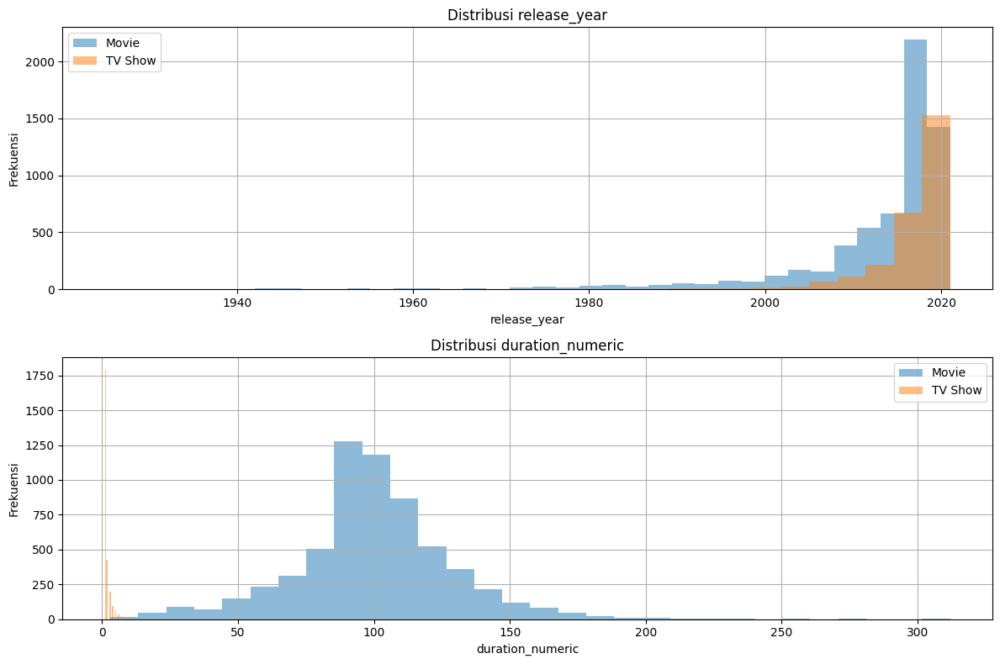

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Asumsikan DataFrame Anda bernama 'df'

# Fungsi untuk menampilkan nilai unik
def display_unique_values(df, column, max_display=10):
    unique_values = df[column].unique()
    print(f"\nNilai unik untuk kolom '{column}' (menampilkan maksimal {max_display}):")
    print(unique_values[:max_display])
    if len(unique_values) > max_display:
        print(f"... dan {len(unique_values) - max_display} nilai lainnya.")

# Menangani kolom date_added
if df['date_added'].dtype != 'datetime64[ns]':
    df['date_added'] = pd.to_datetime(df['date_added'], errors='coerce')

# Menangani kolom duration
def extract_duration(x):
    if isinstance(x, str):
        if 'Season' in x or 'Seasons' in x:
            return pd.to_numeric(x.split()[0], errors='coerce')
        elif 'min' in x:
            return pd.to_numeric(x.split()[0], errors='coerce')
    return np.nan

df['duration_numeric'] = df['duration'].apply(extract_duration)
df['duration_unit'] = df['duration'].apply(lambda x: 'Seasons' if isinstance(x, str) and 'Season' in x else 'min')

# Menangani missing value
df['director'].fillna('Unknown Director', inplace=True)
df['cast'].fillna('Unknown Cast', inplace=True)
df['country'].fillna('Unknown Country', inplace=True)
df['date_added'].fillna(df['date_added'].dropna().mean(), inplace=True)
df['rating'].fillna(df['rating'].mode()[0], inplace=True)

# Mengisi nilai yang hilang untuk duration_numeric berdasarkan tipe
movie_median = df[df['type'] == 'Movie']['duration_numeric'].median()
tv_median = df[df['type'] == 'TV Show']['duration_numeric'].median()

df.loc[(df['type'] == 'Movie') & (df['duration_numeric'].isna()), 'duration_numeric'] = movie_median
df.loc[(df['type'] == 'TV Show') & (df['duration_numeric'].isna()), 'duration_numeric'] = tv_median

# Menampilkan nilai unik untuk setiap kolom
columns_to_check = ['type', 'director', 'cast', 'country', 'rating', 'release_year', 'listed_in', 'duration_unit']

for column in columns_to_check:
    display_unique_values(df, column)

# Menampilkan informasi tentang missing values setelah pengisian
print("\nMissing values setelah pengisian:")
print(df.isnull().sum())

# Visualisasi distribusi untuk beberapa kolom numerik
numeric_columns = ['release_year', 'duration_numeric']

plt.figure(figsize=(12, 8))
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(2, 1, i)
    df[df['type'] == 'Movie'][column].hist(bins=30, alpha=0.5, label='Movie')
    df[df['type'] == 'TV Show'][column].hist(bins=30, alpha=0.5, label='TV Show')
    plt.title(f'Distribusi {column}')
    plt.xlabel(column)
    plt.ylabel('Frekuensi')
    plt.legend()

plt.tight_layout()
plt.show()

In [9]:
import pandas as pd
import numpy as np

# Asumsikan DataFrame Anda bernama 'df'

# Menampilkan informasi tentang missing values sebelum pengisian
print("Missing values sebelum pengisian:")
print(df.isnull().sum())

# Menangani nilai yang hilang di kolom duration
def fill_missing_duration(row):
    if pd.isna(row['duration']):
        if row['type'] == 'Movie':
            return f"{int(row['duration_numeric'])} min"
        elif row['type'] == 'TV Show':
            return f"{int(row['duration_numeric'])} Seasons"
    return row['duration']

# Mengidentifikasi indeks baris dengan nilai yang hilang di kolom duration
missing_duration_indices = df[df['duration'].isnull()].index

# Mengisi nilai yang hilang di kolom duration
df.loc[missing_duration_indices, 'duration'] = df.loc[missing_duration_indices].apply(fill_missing_duration, axis=1)

# Memastikan tidak ada nilai yang hilang di duration_numeric dan duration_unit
df['duration_numeric'] = df['duration_numeric'].fillna(df.groupby('type')['duration_numeric'].transform('median'))
df['duration_unit'] = df['duration_unit'].fillna(df['type'].map({'Movie': 'min', 'TV Show': 'Seasons'}))

# Menampilkan informasi tentang missing values setelah pengisian
print("\nMissing values setelah pengisian:")
print(df.isnull().sum())

# Menampilkan baris yang sebelumnya memiliki nilai yang hilang di kolom duration
print("\nContoh baris yang telah diisi:")
print(df.loc[missing_duration_indices])

Missing values sebelum pengisian:
show_id             0
type                0
title               0
director            0
cast                0
country             0
date_added          0
release_year        0
rating              0
duration            3
listed_in           0
description         0
duration_numeric    0
duration_unit       0
dtype: int64

Missing values setelah pengisian:
show_id             0
type                0
title               0
director            0
cast                0
country             0
date_added          0
release_year        0
rating              0
duration            0
listed_in           0
description         0
duration_numeric    0
duration_unit       0
dtype: int64

Contoh baris yang telah diisi:
     show_id   type                                 title    director  \
5541   s5542  Movie                       Louis C.K. 2017  Louis C.K.   
5794   s5795  Movie                 Louis C.K.: Hilarious  Louis C.K.   
5813   s5814  Movie  Louis C.K.: Live 

In [10]:
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,duration_numeric,duration_unit
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,Unknown Cast,United States,2021-09-25,2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm...",90.0,min
1,s2,TV Show,Blood & Water,Unknown Director,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t...",2.0,Seasons
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",Unknown Country,2021-09-24,2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...,1.0,Seasons
3,s4,TV Show,Jailbirds New Orleans,Unknown Director,Unknown Cast,Unknown Country,2021-09-24,2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo...",1.0,Seasons
4,s5,TV Show,Kota Factory,Unknown Director,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...,2.0,Seasons


In [11]:
df.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description',
       'duration_numeric', 'duration_unit'],
      dtype='object')

Kolom numerik: ['release_year', 'duration_numeric']
Kolom kategorikal: ['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added', 'rating', 'duration', 'listed_in', 'description', 'duration_unit']

Outliers in release_year:
7       1993
22      1996
24      1998
26      1997
41      1975
        ... 
8764    1994
8766    2002
8768    2001
8770    2001
8792    1973
Name: release_year, Length: 719, dtype: int64

Outliers in duration_numeric:
717     273.0
4253    312.0
Name: duration_numeric, dtype: float64


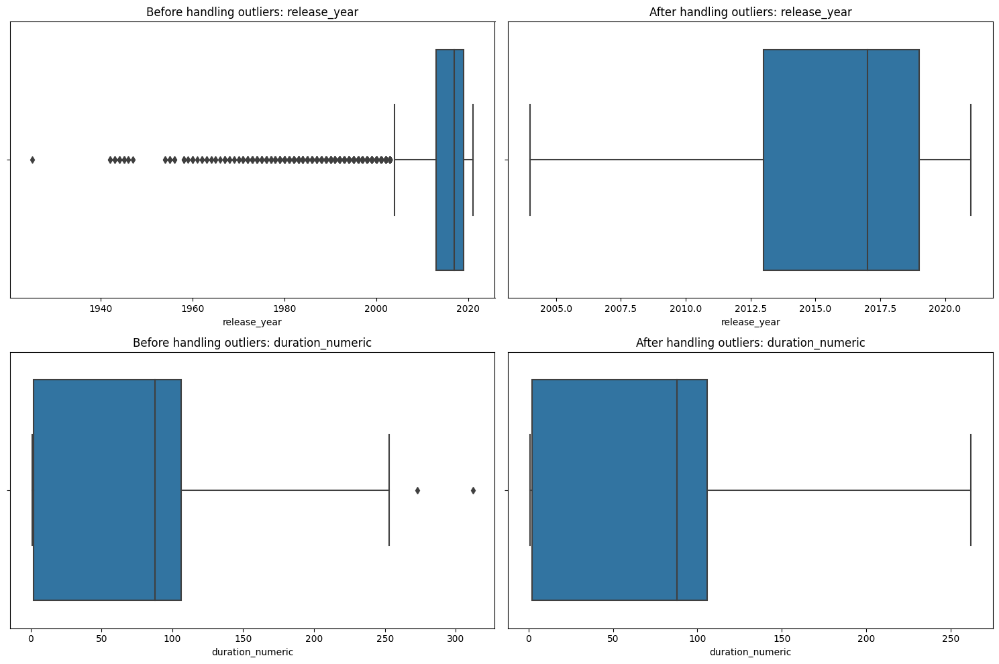


Statistik deskriptif setelah penanganan outlier:
       release_year  duration_numeric
count   8807.000000       8807.000000
mean    2015.300897         69.849551
std        4.951578         50.779694
min     2004.000000          1.000000
25%     2013.000000          2.000000
50%     2017.000000         88.000000
75%     2019.000000        106.000000
max     2021.000000        262.000000


In [12]:
# Memisahkan kolom numerik dan kategorikal
numeric_columns = df.select_dtypes(include=[np.number]).columns
categorical_columns = df.select_dtypes(exclude=[np.number]).columns

print("Kolom numerik:", numeric_columns.tolist())
print("Kolom kategorikal:", categorical_columns.tolist())

# Fungsi untuk mendeteksi outlier menggunakan metode IQR
def detect_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers, lower_bound, upper_bound

# Fungsi untuk menangani outlier dengan capping
def handle_outliers(df, column, lower_bound, upper_bound):
    df[column] = np.where(df[column] < lower_bound, lower_bound, df[column])
    df[column] = np.where(df[column] > upper_bound, upper_bound, df[column])
    return df

# Mendeteksi, menangani, dan memvisualisasikan outlier untuk setiap kolom numerik
plt.figure(figsize=(15, 5 * len(numeric_columns)))

for i, column in enumerate(numeric_columns, 1):
    outliers, lower_bound, upper_bound = detect_outliers(df, column)
    
    print(f"\nOutliers in {column}:")
    print(outliers[column])
    
    plt.subplot(len(numeric_columns), 2, 2*i-1)
    sns.boxplot(x=df[column])
    plt.title(f"Before handling outliers: {column}")
    
    df = handle_outliers(df, column, lower_bound, upper_bound)
    
    plt.subplot(len(numeric_columns), 2, 2*i)
    sns.boxplot(x=df[column])
    plt.title(f"After handling outliers: {column}")

plt.tight_layout()
plt.show()

# Menampilkan statistik deskriptif setelah penanganan outlier
print("\nStatistik deskriptif setelah penanganan outlier:")
print(df[numeric_columns].describe())


Analisis untuk release_year:
Lower bound: 2004.0
Upper bound: 2028.0
Data min: 2004.0
Data max: 2021.0
Jumlah outlier: 0


/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


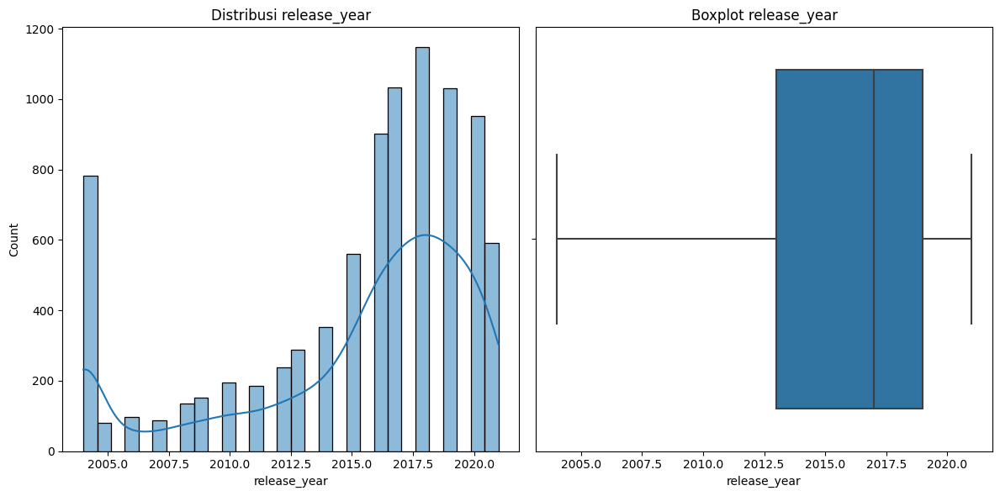


Analisis untuk duration_numeric:
Lower bound: -154.0
Upper bound: 262.0
Data min: 1.0
Data max: 262.0
Jumlah outlier: 0


/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


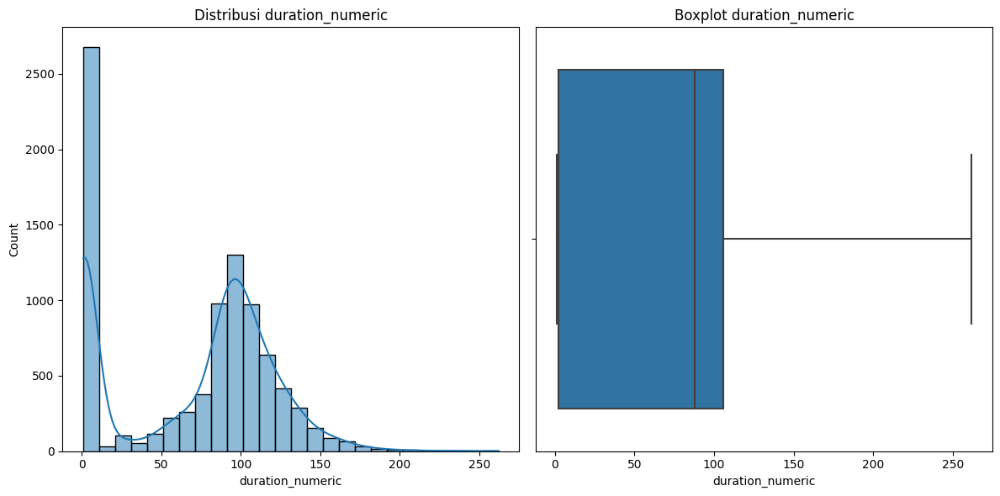


Setelah penanganan outlier:

Analisis untuk release_year:
Lower bound: 2004.0
Upper bound: 2028.0
Data min: 2004.0
Data max: 2021.0
Jumlah outlier: 0


/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


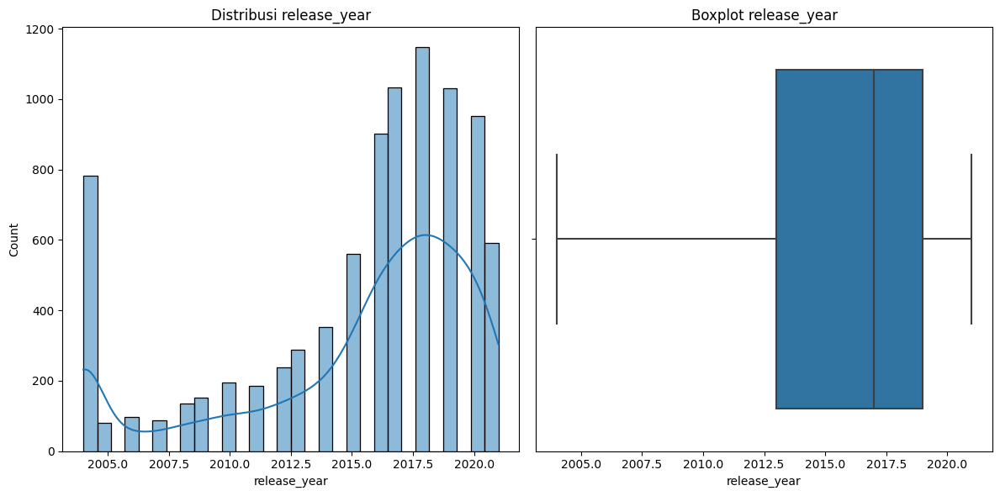


Analisis untuk duration_numeric:
Lower bound: -154.0
Upper bound: 262.0
Data min: 1.0
Data max: 168.0
Jumlah outlier: 0


/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


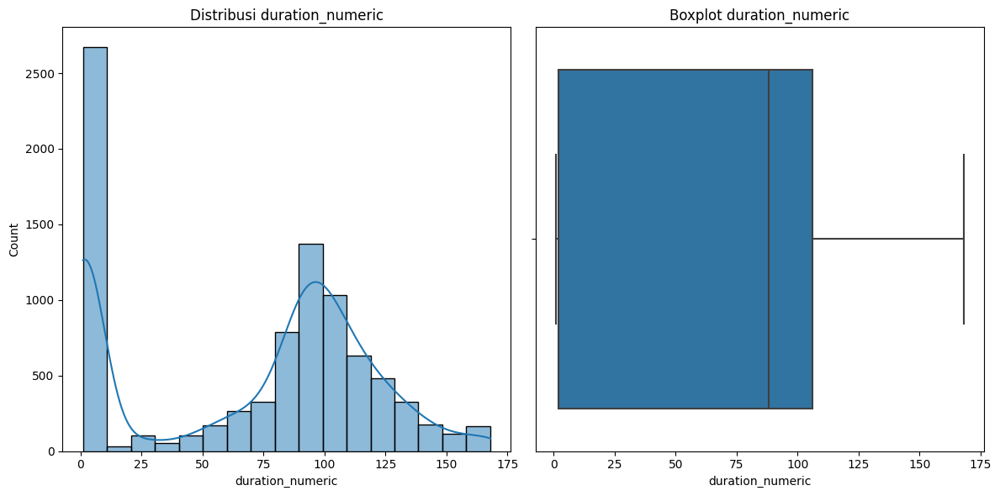


Statistik deskriptif setelah penanganan outlier:
       release_year  duration_numeric
count   8807.000000       8807.000000
mean    2015.300897         69.642898
std        4.951578         50.291460
min     2004.000000          1.000000
25%     2013.000000          2.000000
50%     2017.000000         88.000000
75%     2019.000000        106.000000
max     2021.000000        168.000000


In [13]:
# CHECK OUTLIER DAN HANDLING OUTLIERNYA
# Asumsikan DataFrame Anda bernama 'df'

def analyze_and_handle_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    print(f"\nAnalisis untuk {column}:")
    print(f"Lower bound: {lower_bound}")
    print(f"Upper bound: {upper_bound}")
    print(f"Data min: {df[column].min()}")
    print(f"Data max: {df[column].max()}")
    
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    print(f"Jumlah outlier: {len(outliers)}")
    
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    sns.histplot(df[column], kde=True)
    plt.title(f"Distribusi {column}")
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df[column])
    plt.title(f"Boxplot {column}")
    plt.tight_layout()
    plt.show()
    
    return outliers, lower_bound, upper_bound

# Analisis untuk release_year
outliers_year, lower_year, upper_year = analyze_and_handle_outliers(df, 'release_year')

# Analisis untuk duration_numeric
outliers_duration, lower_duration, upper_duration = analyze_and_handle_outliers(df, 'duration_numeric')

# Penanganan khusus untuk release_year
current_year = pd.Timestamp.now().year
df['release_year'] = np.where(df['release_year'] > current_year, current_year, df['release_year'])
df['release_year'] = np.where(df['release_year'] < 1900, 1900, df['release_year'])

# Penanganan khusus untuk duration_numeric
df['duration_numeric'] = np.where(df['duration_numeric'] < 0, 0, df['duration_numeric'])
upper_percentile = df['duration_numeric'].quantile(0.99)
df['duration_numeric'] = np.where(df['duration_numeric'] > upper_percentile, upper_percentile, df['duration_numeric'])

print("\nSetelah penanganan outlier:")
analyze_and_handle_outliers(df, 'release_year')
analyze_and_handle_outliers(df, 'duration_numeric')

# Menampilkan statistik deskriptif setelah penanganan outlier
print("\nStatistik deskriptif setelah penanganan outlier:")
print(df[['release_year', 'duration_numeric']].describe())

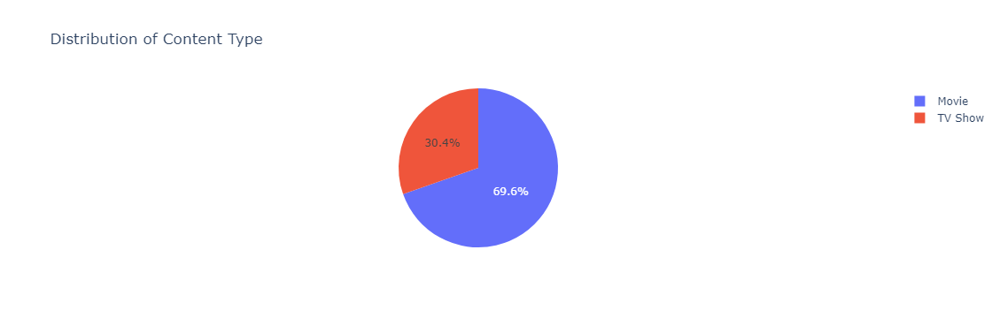

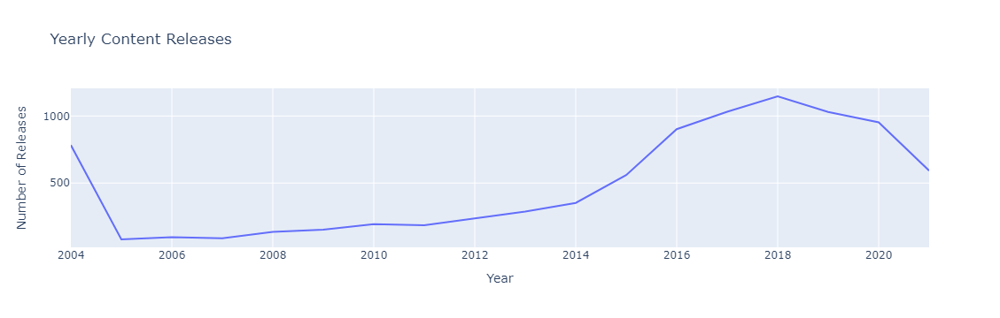

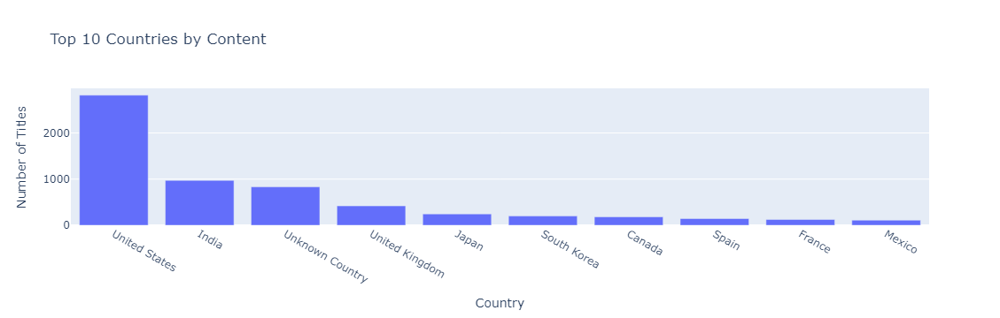

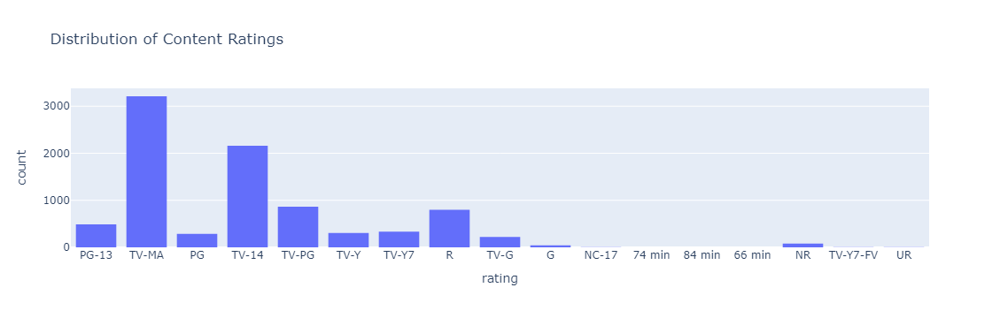

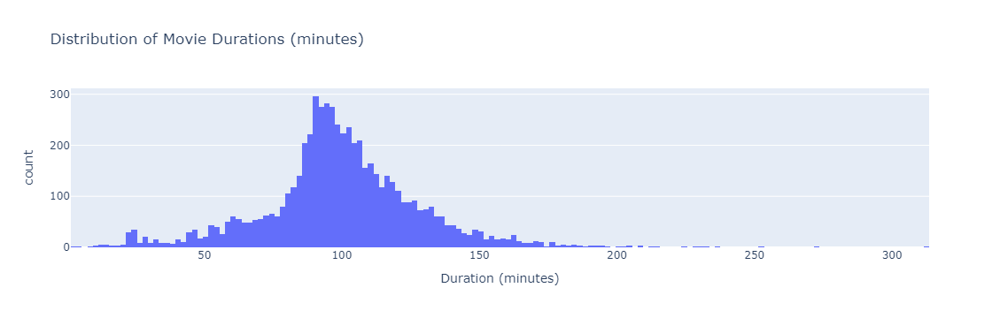

...

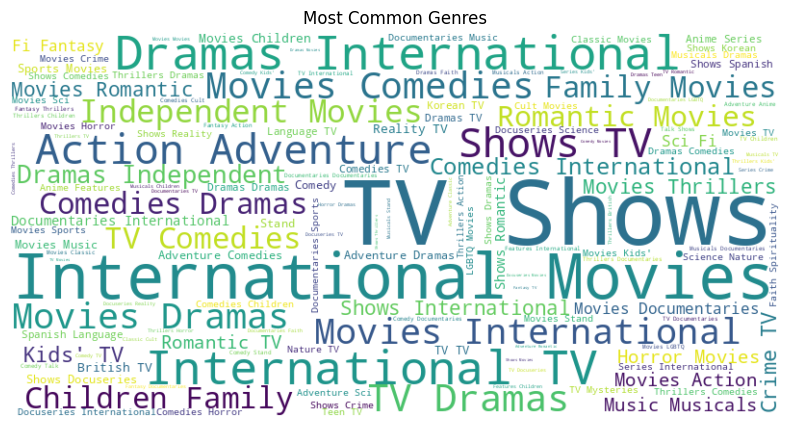

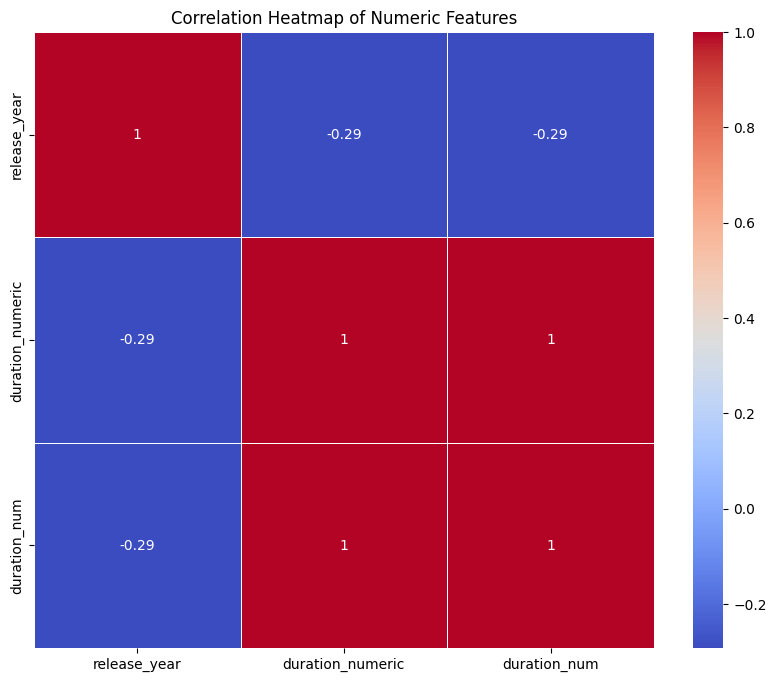

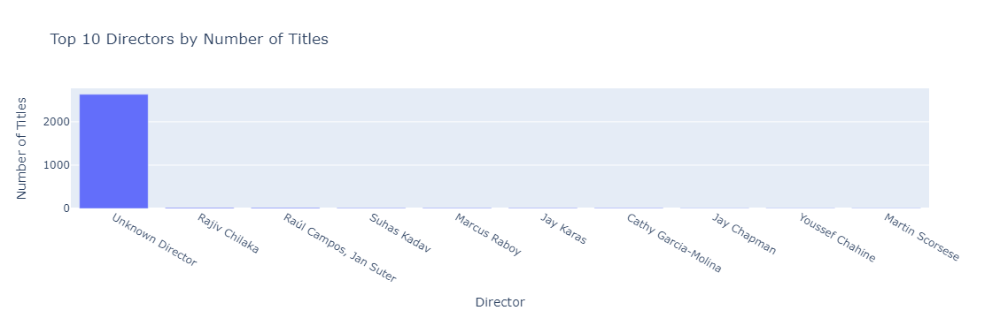

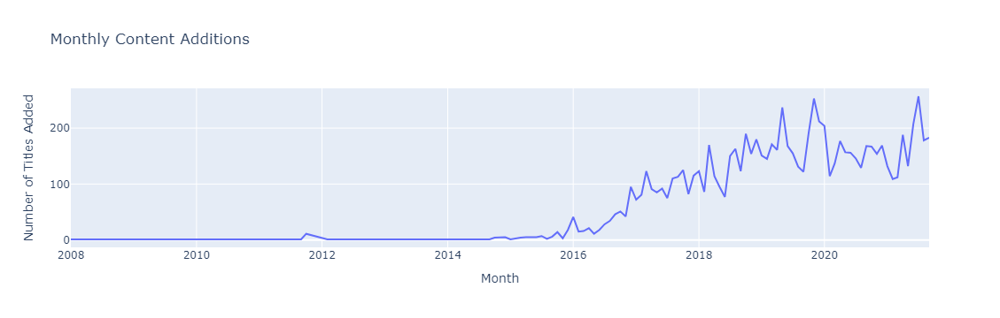

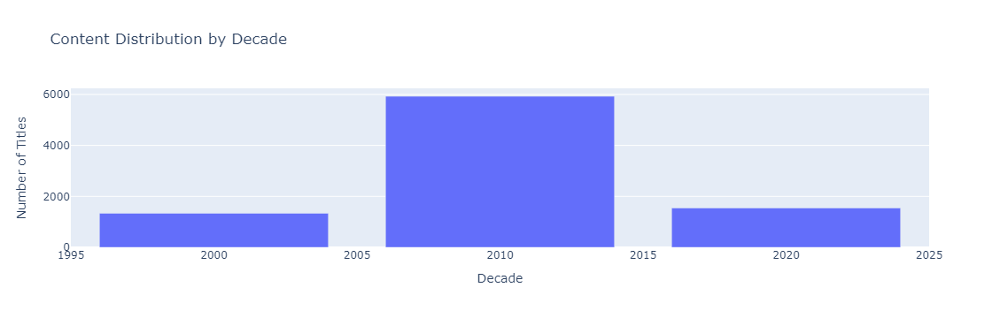

In [14]:
#EDA VISUALISASI

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from wordcloud import WordCloud

# Asumsikan DataFrame Anda bernama 'df'

# 1. Distribusi Tipe Konten
fig = px.pie(df, names='type', title='Distribution of Content Type')
fig.show()

# 2. Trend Perilisan Tahunan
yearly_releases = df['release_year'].value_counts().sort_index()
fig = px.line(x=yearly_releases.index, y=yearly_releases.values, 
              title='Yearly Content Releases',
              labels={'x': 'Year', 'y': 'Number of Releases'})
fig.show()

# 3. Top 10 Negara dengan Konten Terbanyak
top_countries = df['country'].value_counts().head(10)
fig = px.bar(x=top_countries.index, y=top_countries.values, 
             title='Top 10 Countries by Content',
             labels={'x': 'Country', 'y': 'Number of Titles'})
fig.show()

# 4. Distribusi Rating
fig = px.histogram(df, x='rating', title='Distribution of Content Ratings')
fig.show()

# 5. Analisis Durasi
# Pisahkan durasi film (dalam menit) dan TV show (dalam season)
df['duration_num'] = df['duration'].str.extract('(\d+)').astype(float)
df['duration_unit'] = df['duration'].str.extract('(\D+)').squeeze()

# Visualisasi durasi film
movies_duration = df[df['type'] == 'Movie']
fig = px.histogram(movies_duration, x='duration_num', 
                   title='Distribution of Movie Durations (minutes)',
                   labels={'duration_num': 'Duration (minutes)'})
fig.show()

# Visualisasi durasi TV show
tvshow_duration = df[df['type'] == 'TV Show']
fig = px.histogram(tvshow_duration, x='duration_num', 
                   title='Distribution of TV Show Durations (seasons)',
                   labels={'duration_num': 'Number of Seasons'})
fig.show()

# 6. Word Cloud untuk Genre
text = ' '.join(df['listed_in'])
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Most Common Genres')
plt.show()

# 7. Heatmap Korelasi untuk Fitur Numerik
numeric_features = df.select_dtypes(include=[np.number]).columns
correlation = df[numeric_features].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap of Numeric Features')
plt.show()

# 8. Top 10 Directors dengan Konten Terbanyak
top_directors = df['director'].value_counts().head(10)
fig = px.bar(x=top_directors.index, y=top_directors.values, 
             title='Top 10 Directors by Number of Titles',
             labels={'x': 'Director', 'y': 'Number of Titles'})
fig.show()

# 9. Trend Penambahan Konten per Bulan
df['date_added'] = pd.to_datetime(df['date_added'])
monthly_additions = df.groupby(df['date_added'].dt.to_period('M')).size()

fig = px.line(x=monthly_additions.index.astype(str), y=monthly_additions.values,
              title='Monthly Content Additions',
              labels={'x': 'Month', 'y': 'Number of Titles Added'})
fig.show()

# 10. Distribusi Konten berdasarkan Dekade
df['decade'] = (df['release_year'] // 10) * 10
decade_distribution = df['decade'].value_counts().sort_index()

fig = px.bar(x=decade_distribution.index, y=decade_distribution.values,
             title='Content Distribution by Decade',
             labels={'x': 'Decade', 'y': 'Number of Titles'})
fig.show()

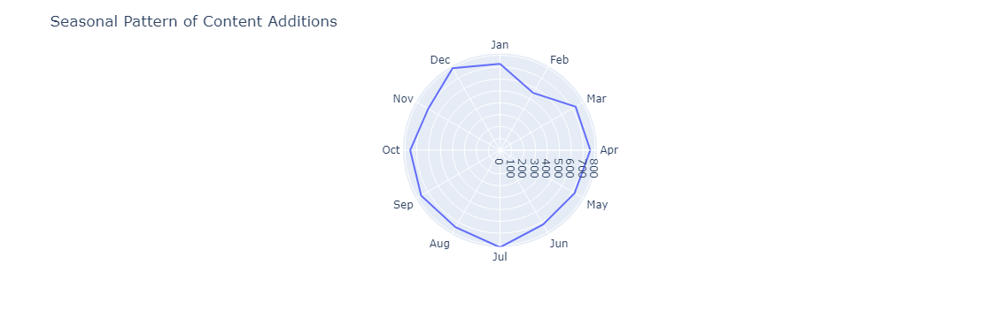

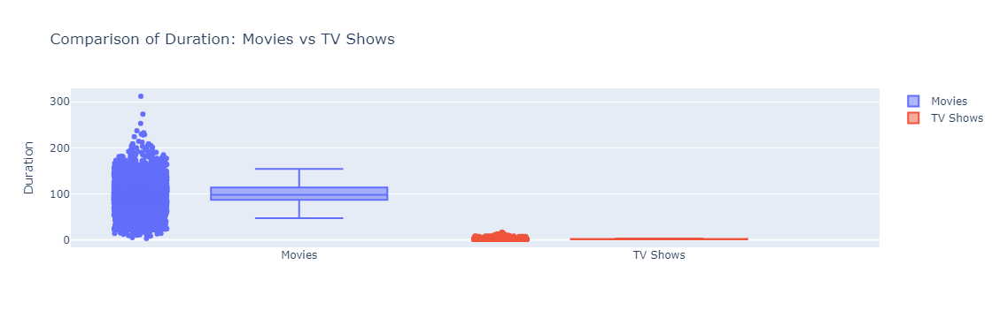

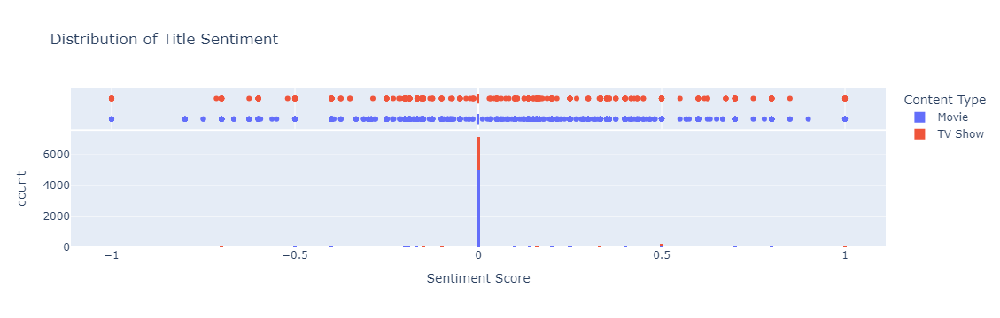

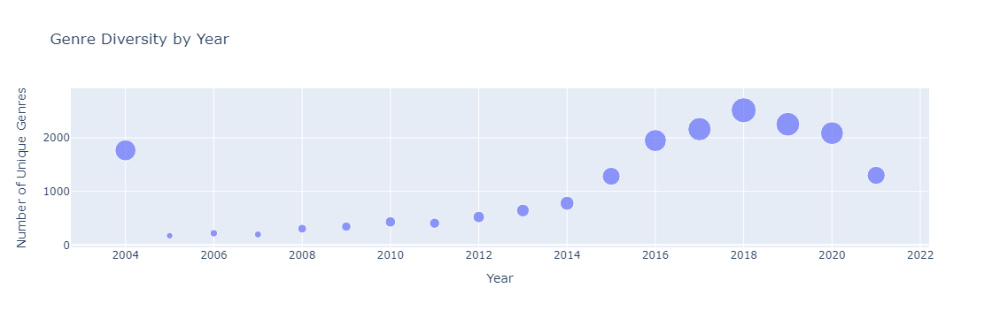

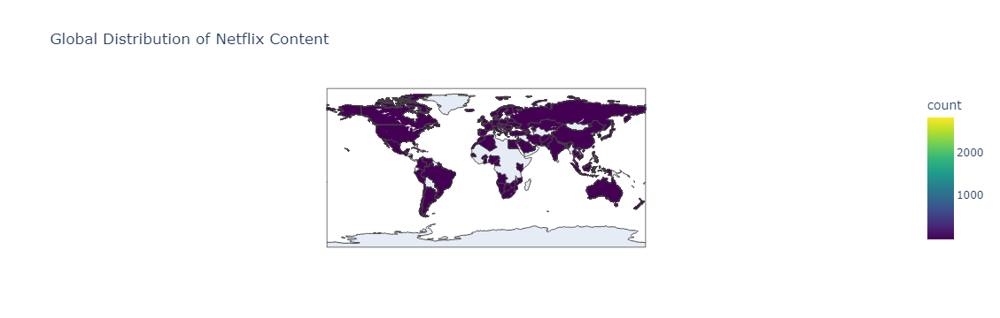

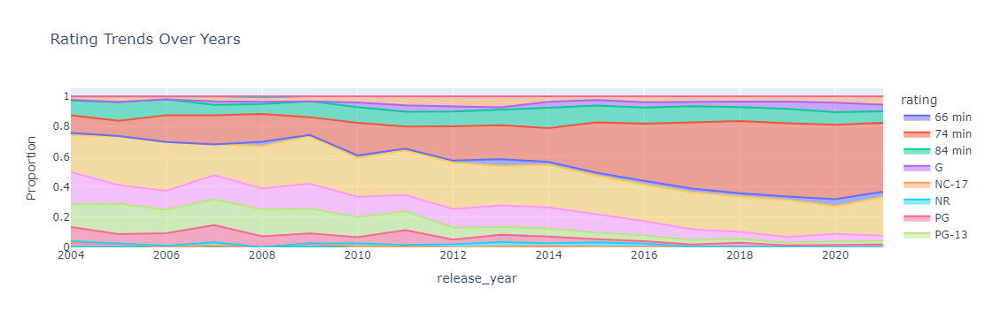

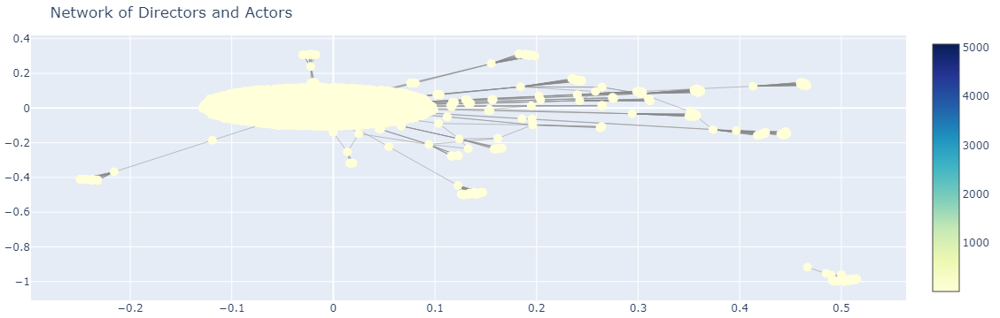

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from wordcloud import WordCloud
from textblob import TextBlob
import calendar

# Asumsikan DataFrame Anda bernama 'df'

# 11. Analisis Musiman Penambahan Konten
df['month_added'] = df['date_added'].dt.month
df['year_added'] = df['date_added'].dt.year
seasonal_additions = df.groupby('month_added').size()

fig = px.line_polar(r=seasonal_additions.values, theta=calendar.month_abbr[1:], line_close=True)
fig.update_layout(title='Seasonal Pattern of Content Additions')
fig.show()

# 12. Perbandingan Durasi Film vs TV Show
fig = go.Figure()
fig.add_trace(go.Box(y=movies_duration['duration_num'], name='Movies', boxpoints='all', jitter=0.3, pointpos=-1.8))
fig.add_trace(go.Box(y=tvshow_duration['duration_num'], name='TV Shows', boxpoints='all', jitter=0.3, pointpos=-1.8))
fig.update_layout(title='Comparison of Duration: Movies vs TV Shows', yaxis_title='Duration')
fig.show()

# 13. Analisis Sentiment Judul
df['title_sentiment'] = df['title'].apply(lambda x: TextBlob(x).sentiment.polarity)

fig = px.histogram(df, x='title_sentiment', color='type', marginal='box',
                   title='Distribution of Title Sentiment',
                   labels={'title_sentiment': 'Sentiment Score', 'type': 'Content Type'})
fig.show()

# 14. Distribusi Genre per Tahun
genre_by_year = df.groupby('release_year')['listed_in'].apply(lambda x: ', '.join(x)).reset_index()
genre_by_year['genre_count'] = genre_by_year['listed_in'].str.count(',') + 1

fig = px.scatter(genre_by_year, x='release_year', y='genre_count', size='genre_count', 
                 title='Genre Diversity by Year',
                 labels={'release_year': 'Year', 'genre_count': 'Number of Unique Genres'})
fig.show()

# 15. Peta Choropleth untuk Distribusi Konten Global
country_counts = df['country'].value_counts().reset_index()
country_counts.columns = ['country', 'count']

fig = px.choropleth(country_counts, locations='country', locationmode='country names', color='count',
                    title='Global Distribution of Netflix Content',
                    color_continuous_scale='Viridis')
fig.show()

# 16. Analisis Tren Rating Berdasarkan Tahun
rating_trend = df.groupby('release_year')['rating'].value_counts(normalize=True).unstack()
fig = px.area(rating_trend, title='Rating Trends Over Years', labels={'value': 'Proportion', 'index': 'Year'})
fig.show()

# 17. Network Graph of Actors and Directors
from networkx import Graph
import networkx as nx

def create_network(df, n_top=20):
    G = Graph()
    top_directors = df['director'].value_counts().head(n_top).index
    for _, row in df[df['director'].isin(top_directors)].iterrows():
        director = row['director']
        actors = row['cast'].split(', ')[:3]  # Consider only top 3 actors
        for actor in actors:
            G.add_edge(director, actor)
    return G

network = create_network(df)
pos = nx.spring_layout(network)
edge_x, edge_y = [], []
for edge in network.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

edge_trace = go.Scatter(x=edge_x, y=edge_y, line=dict(width=0.5, color='#888'), hoverinfo='none', mode='lines')

node_x, node_y = [], []
for node in network.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)

node_trace = go.Scatter(x=node_x, y=node_y, mode='markers', hoverinfo='text',
                        marker=dict(showscale=True, colorscale='YlGnBu', size=10))

node_adjacencies = []
node_text = []
for node, adjacencies in enumerate(network.adjacency()):
    node_adjacencies.append(len(adjacencies[1]))
    node_text.append(f'{list(network.nodes())[node]}: {len(adjacencies[1])} connections')

node_trace.marker.color = node_adjacencies
node_trace.text = node_text

fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(title='Network of Directors and Actors', showlegend=False,
                                 hovermode='closest', margin=dict(b=20,l=5,r=5,t=40)))
fig.show()

/tmp/ipykernel_947/1441065837.py:11: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



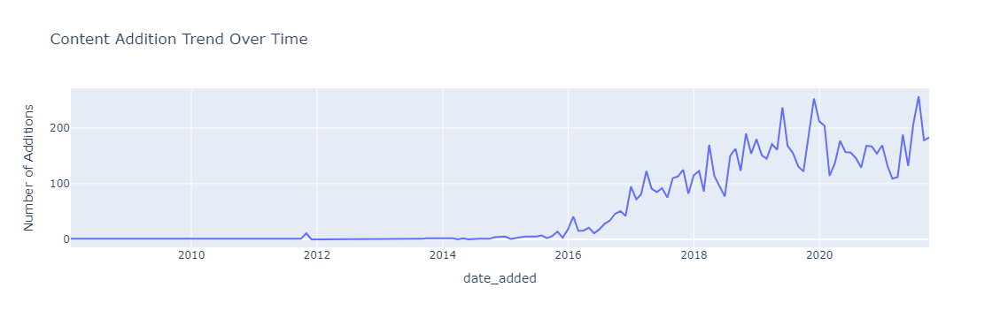

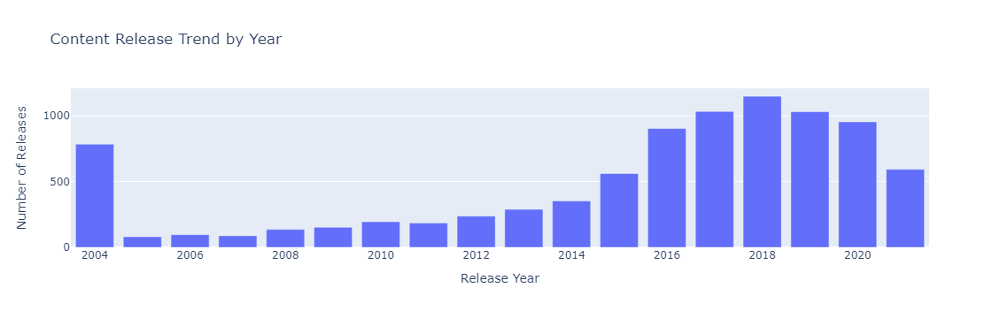

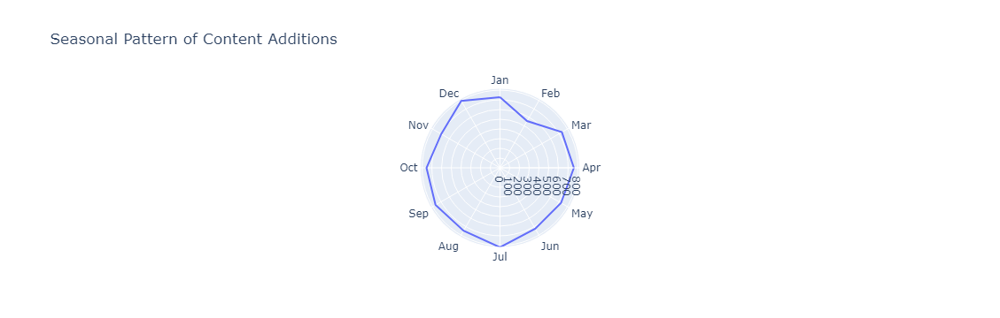

In [16]:
import pandas as pd
import plotly.express as px
import calendar

# Asumsi: DataFrame Anda bernama 'df' dan memiliki kolom yang disebutkan

# Ubah kolom 'date_added' menjadi tipe datetime
df['date_added'] = pd.to_datetime(df['date_added'])

# 1. Tren Penambahan Konten dari Waktu ke Waktu
content_addition_trend = df.resample('M', on='date_added').size()

fig = px.line(content_addition_trend, x=content_addition_trend.index, y=content_addition_trend.values, 
              title='Content Addition Trend Over Time',
              labels={'x': 'Date', 'y': 'Number of Additions'})
fig.show()

# 2. Tren Rilis Konten per Tahun
content_release_trend = df.groupby('release_year').size()

fig = px.bar(x=content_release_trend.index, y=content_release_trend.values,
             title='Content Release Trend by Year',
             labels={'x': 'Release Year', 'y': 'Number of Releases'})
fig.show()

# 3. Analisis Musiman Penambahan Konten
df['month_added'] = df['date_added'].dt.month 
seasonal_additions = df.groupby('month_added').size()

fig = px.line_polar(r=seasonal_additions.values, theta=calendar.month_abbr[1:], line_close=True,
                    title='Seasonal Pattern of Content Additions')
fig.show()

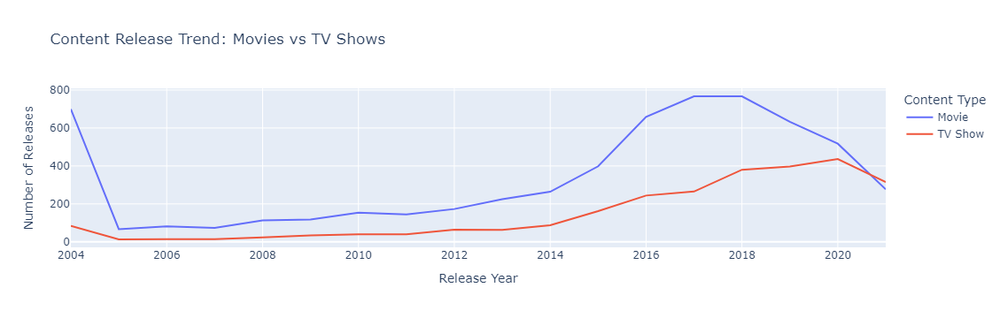

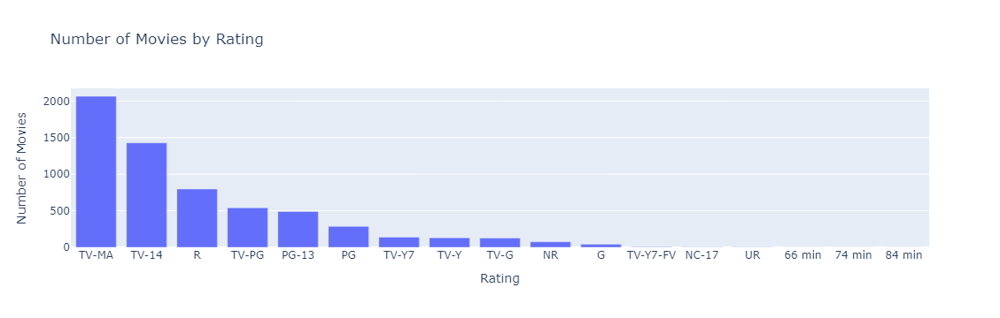

In [17]:
# Grouped Line Chart - Perbandingan Tren Rilis Film vs TV Show
release_trend = df.groupby(['release_year', 'type']).size().reset_index(name='count')

fig = px.line(release_trend, x='release_year', y='count', color='type', 
              title='Content Release Trend: Movies vs TV Shows',
              labels={'release_year': 'Release Year', 'count': 'Number of Releases', 'type': 'Content Type'})
fig.show()

# Bar Chart - Perbandingan Jumlah Film per Rating
rating_counts = df[df['type'] == 'Movie'].groupby('rating').size().reset_index(name='count')

fig = px.bar(rating_counts, x='rating', y='count',
             title='Number of Movies by Rating',
             labels={'rating': 'Rating', 'count': 'Number of Movies'})
fig.update_layout(xaxis_categoryorder='total descending')
fig.show()

In [18]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import dendrogram
import plotly.express as px
import plotly.graph_objects as go

def safe_extract_numeric(x):
    try:
        return pd.to_numeric(x.split()[0])
    except:
        return np.nan

def preprocess_data(df):
    df['duration_numeric'] = df['duration'].apply(safe_extract_numeric)
    df['release_decade'] = (df['release_year'] // 10) * 10
    
    columns_for_clustering = ['type', 'release_decade', 'rating', 'duration_numeric', 'country']
    
    for col in columns_for_clustering:
        if df[col].dtype == 'object':
            df[col] = df[col].fillna('Unknown')
        else:
            df[col] = df[col].fillna(df[col].median())
    
    return df, columns_for_clustering

def encode_and_scale(df, columns):
    numeric_features = ['release_decade', 'duration_numeric']
    categorical_features = [col for col in columns if col not in numeric_features]

    preprocessor = ColumnTransformer(
        transformers=[
            ('num', StandardScaler(), numeric_features),
            ('cat', OneHotEncoder(handle_unknown='ignore', sparse=False), categorical_features)
        ])

    X = preprocessor.fit_transform(df[columns])
    return X, preprocessor

def plot_dendrogram(model, **kwargs):
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_, counts]).astype(float)
    dendrogram(linkage_matrix, **kwargs)

def hierarchical_clustering(X, n_clusters=5):
    clustering = AgglomerativeClustering(n_clusters=n_clusters)
    labels = clustering.fit_predict(X)
    
    plt.figure(figsize=(10, 7))
    plot_dendrogram(clustering, truncate_mode='level', p=3)
    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('Number of points in node (or index of point if no parenthesis)')
    plt.show()
    
    return labels

def kmeans_clustering(X, max_clusters=10):
    inertias = []
    silhouette_scores = []
    for k in range(2, max_clusters + 1):
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = kmeans.fit_predict(X)
        inertias.append(kmeans.inertia_)
        silhouette_scores.append(silhouette_score(X, labels))
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    ax1.plot(range(2, max_clusters + 1), inertias, marker='o')
    ax1.set_xlabel('Number of clusters')
    ax1.set_ylabel('Inertia')
    ax1.set_title('Elbow Method')
    
    ax2.plot(range(2, max_clusters + 1), silhouette_scores, marker='o')
    ax2.set_xlabel('Number of clusters')
    ax2.set_ylabel('Silhouette Score')
    ax2.set_title('Silhouette Analysis')
    
    plt.tight_layout()
    plt.show()

    optimal_k = int(input("Enter the optimal number of clusters based on the plots: "))
    kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X)
    return labels

def gmm_clustering(X, max_components=10):
    bic_scores = []
    for n in range(1, max_components + 1):
        gmm = GaussianMixture(n_components=n, random_state=42)
        gmm.fit(X)
        bic_scores.append(gmm.bic(X))
    
    plt.plot(range(1, max_components + 1), bic_scores, marker='o')
    plt.xlabel('Number of components')
    plt.ylabel('BIC score')
    plt.title('BIC Score for GMM')
    plt.show()

    optimal_n = int(input("Enter the optimal number of components based on the BIC plot: "))
    gmm = GaussianMixture(n_components=optimal_n, random_state=42)
    labels = gmm.fit_predict(X)
    return labels

def analyze_clusters(df, labels, columns):
    df['Cluster'] = labels
    for cluster in set(labels):
        print(f"\nCluster {cluster}:")
        cluster_data = df[df['Cluster'] == cluster]
        for col in columns:
            if df[col].dtype == 'object':
                print(f"Top 5 {col}:")
                print(cluster_data[col].value_counts().head())
            else:
                print(f"{col} statistics:")
                print(cluster_data[col].describe())
        print("\n" + "="*50)

def visualize_clusters_pca(X, labels, title):
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)
    
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis')
    plt.title(f'PCA of {title}')
    plt.xlabel('First Principal Component')
    plt.ylabel('Second Principal Component')
    plt.colorbar(scatter)
    plt.show()

def visualize_cluster_characteristics(df, labels, columns, title):
    df['Cluster'] = labels
    cluster_means = df.groupby('Cluster')[columns].mean()
    
    plt.figure(figsize=(12, 8))
    sns.heatmap(cluster_means, annot=True, cmap='YlGnBu', fmt='.2f')
    plt.title(f'Cluster Characteristics - {title}')
    plt.show()

def visualize_feature_distribution(df, labels, columns, title):
    df['Cluster'] = labels
    melted_df = df.melt(id_vars=['Cluster'], value_vars=columns, var_name='Feature', value_name='Value')
    
    fig = px.box(melted_df, x='Feature', y='Value', color='Cluster', title=f'Feature Distribution by Cluster - {title}')
    fig.show()

def visualize_parallel_coordinates(df, labels, columns, title):
    df['Cluster'] = labels
    fig = px.parallel_coordinates(df, color="Cluster", dimensions=columns, title=f'Parallel Coordinates - {title}')
    fig.show()

# Main execution
try:
    # Pastikan df sudah didefinisikan sebelumnya
    df, columns_for_clustering = preprocess_data(df)
    X, preprocessor = encode_and_scale(df, columns_for_clustering)

    print("Performing Hierarchical Clustering...")
    hierarchical_labels = hierarchical_clustering(X)
    visualize_clusters_pca(X, hierarchical_labels, "Hierarchical Clustering")
    visualize_cluster_characteristics(df, hierarchical_labels, columns_for_clustering, "Hierarchical Clustering")
    visualize_feature_distribution(df, hierarchical_labels, columns_for_clustering, "Hierarchical Clustering")
    visualize_parallel_coordinates(df, hierarchical_labels, columns_for_clustering, "Hierarchical Clustering")
    
    print("\nPerforming K-means Clustering...")
    kmeans_labels = kmeans_clustering(X)
    visualize_clusters_pca(X, kmeans_labels, "K-means Clustering")
    visualize_cluster_characteristics(df, kmeans_labels, columns_for_clustering, "K-means Clustering")
    visualize_feature_distribution(df, kmeans_labels, columns_for_clustering, "K-means Clustering")
    visualize_parallel_coordinates(df, kmeans_labels, columns_for_clustering, "K-means Clustering")
    
    print("\nPerforming GMM Clustering...")
    gmm_labels = gmm_clustering(X)
    visualize_clusters_pca(X, gmm_labels, "GMM Clustering")
    visualize_cluster_characteristics(df, gmm_labels, columns_for_clustering, "GMM Clustering")
    visualize_feature_distribution(df, gmm_labels, columns_for_clustering, "GMM Clustering")
    visualize_parallel_coordinates(df, gmm_labels, columns_for_clustering, "GMM Clustering")

    # Analyze clusters
    print("\nHierarchical Clustering Analysis:")
    analyze_clusters(df, hierarchical_labels, columns_for_clustering)
    
    print("\nK-means Clustering Analysis:")
    analyze_clusters(df, kmeans_labels, columns_for_clustering)
    
    print("\nGMM Clustering Analysis:")
    analyze_clusters(df, gmm_labels, columns_for_clustering)

except Exception as e:
    print(f"An error occurred: {str(e)}")
    print("\nPlease check your data and make sure all required columns are present.")
    print("Required columns: 'type', 'release_year', 'rating', 'duration', 'country'")
    
    if 'df' in globals():
        print("\nAvailable columns in your DataFrame:")
        print(df.columns.tolist())
        
        print("\nData types of columns:")
        print(df.dtypes)
        
        print("\nSample data (first 5 rows):")
        print(df.head())
    
    print("\nIf the problem persists, please provide more details about your data and the specific error message.")

/usr/local/lib/python3.11/dist-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



Performing Hierarchical Clustering...
An error occurred: 'AgglomerativeClustering' object has no attribute 'distances_'

Please check your data and make sure all required columns are present.
Required columns: 'type', 'release_year', 'rating', 'duration', 'country'

Available columns in your DataFrame:
['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added', 'release_year', 'rating', 'duration', 'listed_in', 'description', 'duration_numeric', 'duration_unit', 'duration_num', 'decade', 'month_added', 'year_added', 'title_sentiment', 'release_decade']

Data types of columns:
show_id                     object
type                        object
title                       object
director                    object
cast                        object
country                     object
date_added          datetime64[ns]
release_year               float64
rating                      object
duration                    object
listed_in                   object
description       

<Figure size 1000x700 with 0 Axes>

In [19]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import dendrogram
import plotly.express as px
import plotly.graph_objects as go

def safe_extract_numeric(x):
    try:
        return pd.to_numeric(x.split()[0])
    except:
        return np.nan

def preprocess_data(df):
    df['duration_numeric'] = df['duration'].apply(safe_extract_numeric)
    df['release_decade'] = (df['release_year'] // 10) * 10
    
    columns_for_clustering = ['type', 'release_decade', 'rating', 'duration_numeric', 'country']
    
    for col in columns_for_clustering:
        if df[col].dtype == 'object':
            df[col] = df[col].fillna('Unknown')
        else:
            df[col] = df[col].fillna(df[col].median())
    
    return df, columns_for_clustering

def encode_and_scale(df, columns):
    numeric_features = ['release_decade', 'duration_numeric']
    categorical_features = [col for col in columns if col not in numeric_features]

    preprocessor = ColumnTransformer(
        transformers=[
            ('num', StandardScaler(), numeric_features),
            ('cat', OneHotEncoder(handle_unknown='ignore', sparse=False), categorical_features)
        ])

    X = preprocessor.fit_transform(df[columns])
    return X, preprocessor

def plot_dendrogram(model, **kwargs):
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_, counts]).astype(float)
    dendrogram(linkage_matrix, **kwargs)

def hierarchical_clustering(X, n_clusters=5):
    clustering = AgglomerativeClustering(n_clusters=n_clusters)
    labels = clustering.fit_predict(X)
    
    plt.figure(figsize=(10, 7))
    plot_dendrogram(clustering, truncate_mode='level', p=3)
    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('Number of points in node (or index of point if no parenthesis)')
    plt.show()
    
    return labels

def kmeans_clustering(X, max_clusters=10):
    inertias = []
    silhouette_scores = []
    for k in range(2, max_clusters + 1):
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = kmeans.fit_predict(X)
        inertias.append(kmeans.inertia_)
        silhouette_scores.append(silhouette_score(X, labels))
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    ax1.plot(range(2, max_clusters + 1), inertias, marker='o')
    ax1.set_xlabel('Number of clusters')
    ax1.set_ylabel('Inertia')
    ax1.set_title('Elbow Method')
    
    ax2.plot(range(2, max_clusters + 1), silhouette_scores, marker='o')
    ax2.set_xlabel('Number of clusters')
    ax2.set_ylabel('Silhouette Score')
    ax2.set_title('Silhouette Analysis')
    
    plt.tight_layout()
    plt.show()

    optimal_k = int(input("Enter the optimal number of clusters based on the plots: "))
    kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X)
    return labels

def gmm_clustering(X, max_components=10):
    bic_scores = []
    for n in range(1, max_components + 1):
        gmm = GaussianMixture(n_components=n, random_state=42)
        gmm.fit(X)
        bic_scores.append(gmm.bic(X))
    
    plt.plot(range(1, max_components + 1), bic_scores, marker='o')
    plt.xlabel('Number of components')
    plt.ylabel('BIC score')
    plt.title('BIC Score for GMM')
    plt.show()

    optimal_n = int(input("Enter the optimal number of components based on the BIC plot: "))
    gmm = GaussianMixture(n_components=optimal_n, random_state=42)
    labels = gmm.fit_predict(X)
    return labels

def analyze_clusters(df, labels, columns):
    df['Cluster'] = labels
    for cluster in set(labels):
        print(f"\nCluster {cluster}:")
        cluster_data = df[df['Cluster'] == cluster]
        for col in columns:
            if df[col].dtype == 'object':
                print(f"Top 5 {col}:")
                print(cluster_data[col].value_counts().head())
            else:
                print(f"{col} statistics:")
                print(cluster_data[col].describe())
        print("\n" + "="*50)

def visualize_clusters_pca(X, labels, title):
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)
    
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis')
    plt.title(f'PCA of {title}')
    plt.xlabel('First Principal Component')
    plt.ylabel('Second Principal Component')
    plt.colorbar(scatter)
    plt.show()

def visualize_cluster_characteristics(df, labels, columns, title):
    df['Cluster'] = labels
    cluster_means = df.groupby('Cluster')[columns].mean()
    
    plt.figure(figsize=(12, 8))
    sns.heatmap(cluster_means, annot=True, cmap='YlGnBu', fmt='.2f')
    plt.title(f'Cluster Characteristics - {title}')
    plt.show()

def visualize_feature_distribution(df, labels, columns, title):
    df['Cluster'] = labels
    melted_df = df.melt(id_vars=['Cluster'], value_vars=columns, var_name='Feature', value_name='Value')
    
    fig = px.box(melted_df, x='Feature', y='Value', color='Cluster', title=f'Feature Distribution by Cluster - {title}')
    fig.show()

def visualize_parallel_coordinates(df, labels, columns, title):
    df['Cluster'] = labels
    fig = px.parallel_coordinates(df, color="Cluster", dimensions=columns, title=f'Parallel Coordinates - {title}')
    fig.show()

# Main execution
try:
    # Pastikan df sudah didefinisikan sebelumnya
    df, columns_for_clustering = preprocess_data(df)
    X, preprocessor = encode_and_scale(df, columns_for_clustering)

    print("Performing Hierarchical Clustering...")
    hierarchical_labels = hierarchical_clustering(X)
    visualize_clusters_pca(X, hierarchical_labels, "Hierarchical Clustering")
    visualize_cluster_characteristics(df, hierarchical_labels, columns_for_clustering, "Hierarchical Clustering")
    visualize_feature_distribution(df, hierarchical_labels, columns_for_clustering, "Hierarchical Clustering")
    visualize_parallel_coordinates(df, hierarchical_labels, columns_for_clustering, "Hierarchical Clustering")
    
    print("\nPerforming K-means Clustering...")
    kmeans_labels = kmeans_clustering(X)
    visualize_clusters_pca(X, kmeans_labels, "K-means Clustering")
    visualize_cluster_characteristics(df, kmeans_labels, columns_for_clustering, "K-means Clustering")
    visualize_feature_distribution(df, kmeans_labels, columns_for_clustering, "K-means Clustering")
    visualize_parallel_coordinates(df, kmeans_labels, columns_for_clustering, "K-means Clustering")
    
    print("\nPerforming GMM Clustering...")
    gmm_labels = gmm_clustering(X)
    visualize_clusters_pca(X, gmm_labels, "GMM Clustering")
    visualize_cluster_characteristics(df, gmm_labels, columns_for_clustering, "GMM Clustering")
    visualize_feature_distribution(df, gmm_labels, columns_for_clustering, "GMM Clustering")
    visualize_parallel_coordinates(df, gmm_labels, columns_for_clustering, "GMM Clustering")

    # Analyze clusters
    print("\nHierarchical Clustering Analysis:")
    analyze_clusters(df, hierarchical_labels, columns_for_clustering)
    
    print("\nK-means Clustering Analysis:")
    analyze_clusters(df, kmeans_labels, columns_for_clustering)
    
    print("\nGMM Clustering Analysis:")
    analyze_clusters(df, gmm_labels, columns_for_clustering)

except Exception as e:
    print(f"An error occurred: {str(e)}")
    print("\nPlease check your data and make sure all required columns are present.")
    print("Required columns: 'type', 'release_year', 'rating', 'duration', 'country'")
    
    if 'df' in globals():
        print("\nAvailable columns in your DataFrame:")
        print(df.columns.tolist())
        
        print("\nData types of columns:")
        print(df.dtypes)
        
        print("\nSample data (first 5 rows):")
        print(df.head())
    
    print("\nIf the problem persists, please provide more details about your data and the specific error message.")

Performing Hierarchical Clustering...


/usr/local/lib/python3.11/dist-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



An error occurred: 'AgglomerativeClustering' object has no attribute 'distances_'

Please check your data and make sure all required columns are present.
Required columns: 'type', 'release_year', 'rating', 'duration', 'country'

Available columns in your DataFrame:
['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added', 'release_year', 'rating', 'duration', 'listed_in', 'description', 'duration_numeric', 'duration_unit', 'duration_num', 'decade', 'month_added', 'year_added', 'title_sentiment', 'release_decade']

Data types of columns:
show_id                     object
type                        object
title                       object
director                    object
cast                        object
country                     object
date_added          datetime64[ns]
release_year               float64
rating                      object
duration                    object
listed_in                   object
description                 object
duration_numeric     

<Figure size 1000x700 with 0 Axes>

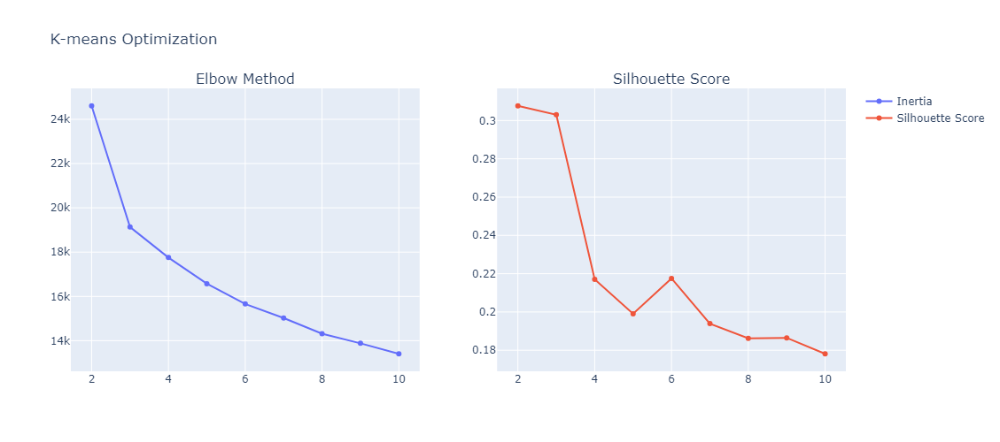

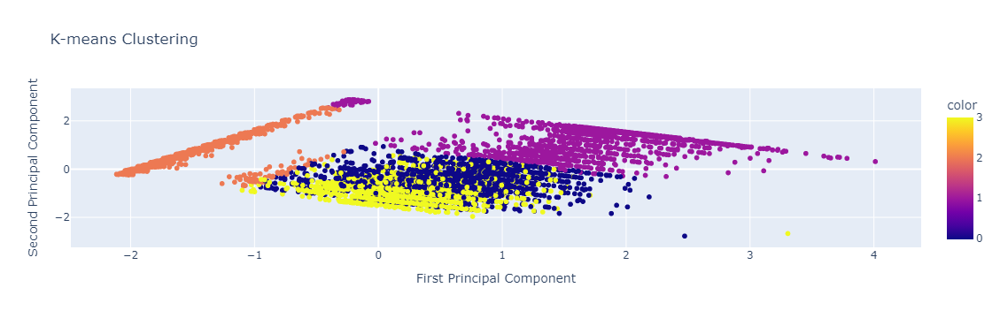

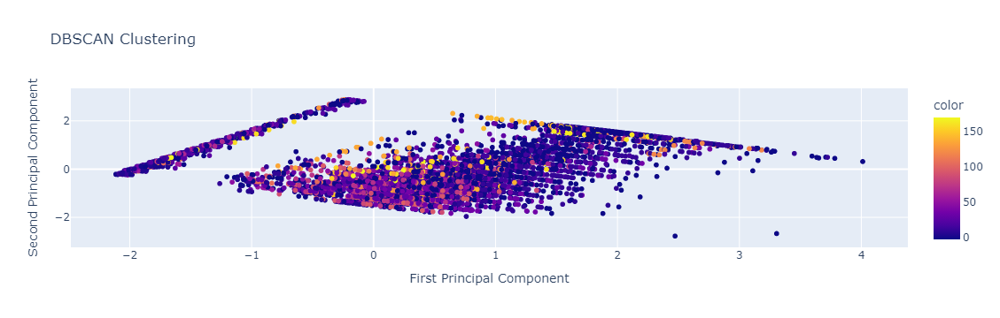


Cluster 0 Statistics:
       release_year  duration_numeric
count   2729.000000       2729.000000
mean    2016.882741         98.367534
std        2.416833         26.035367
min     2011.000000         22.000000
25%     2015.000000         87.000000
50%     2017.000000         97.000000
75%     2019.000000        113.000000
max     2021.000000        273.000000

Top 5 type in Cluster 0:
type
Movie    2729
Name: count, dtype: int64

Top 5 rating in Cluster 0:
rating
TV-14    1067
R         502
TV-PG     410
PG-13     223
PG        143
Name: count, dtype: int64

Top 5 country in Cluster 0:
country
United States      904
India              417
Unknown Country    235
United Kingdom      97
Canada              65
Name: count, dtype: int64

Cluster 1 Statistics:
       release_year  duration_numeric
count   1535.000000       1535.000000
mean    2006.193485        104.874919
std        2.626653         39.436513
min     2004.000000          1.000000
25%     2004.000000         91.000000
50% 

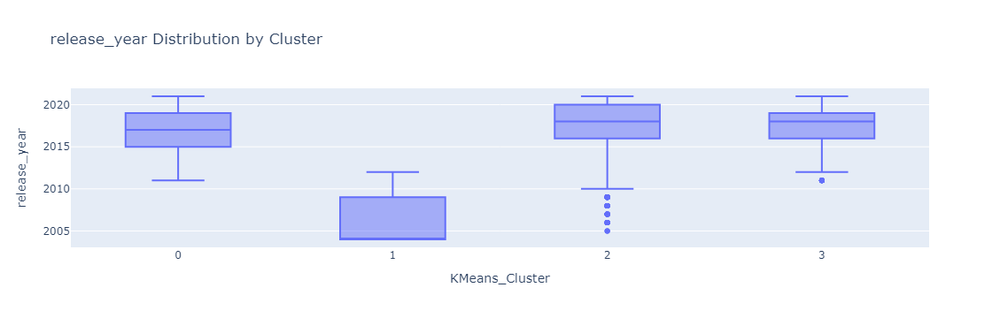

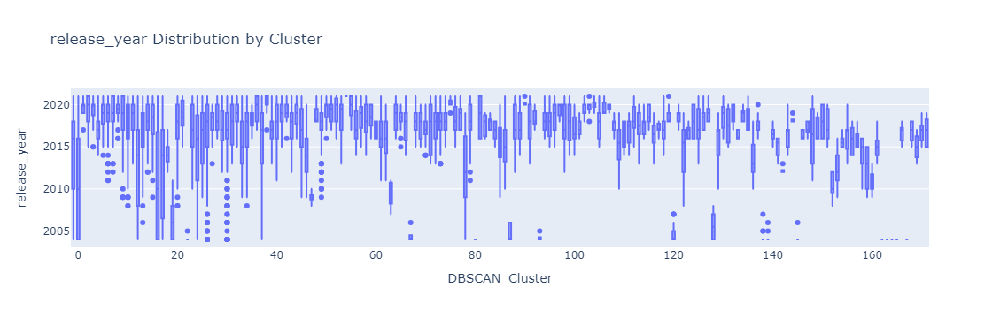

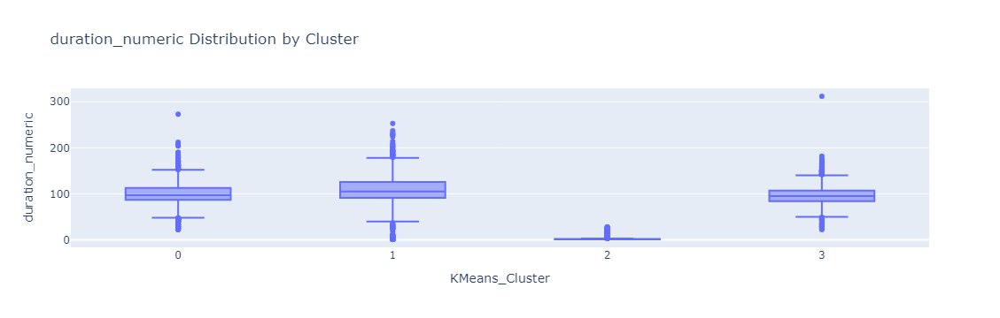

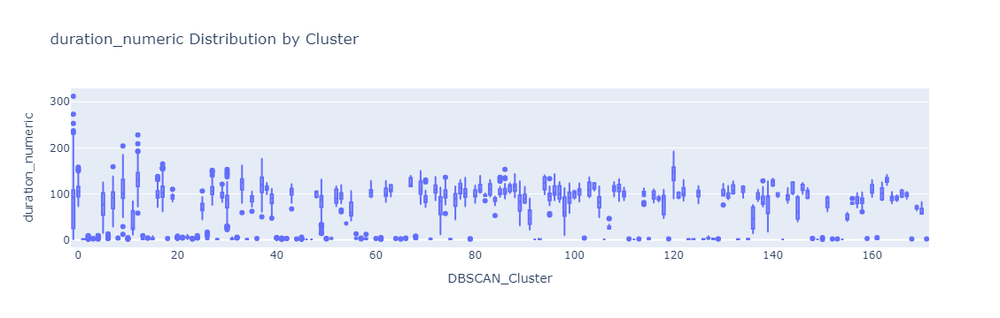

In [20]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Asumsikan DataFrame Anda bernama 'df'

# Fungsi untuk mengekstrak nilai numerik dari kolom duration
def extract_numeric_duration(duration):
    if pd.isna(duration):
        return np.nan
    return float(duration.split()[0])

# Aplikasikan fungsi ke kolom duration
df['duration_numeric'] = df['duration'].apply(extract_numeric_duration)

# 1. Preprocessing
columns_for_clustering = ['type', 'release_year', 'rating', 'duration_numeric', 'country']
numeric_features = ['release_year', 'duration_numeric']
categorical_features = ['type', 'rating', 'country']

# Periksa dan tangani nilai yang hilang
df[numeric_features] = df[numeric_features].fillna(df[numeric_features].median())
df[categorical_features] = df[categorical_features].fillna('Unknown')

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
    ])

# Fit dan transform data
X = preprocessor.fit_transform(df[columns_for_clustering])

# 2. Elbow Method untuk K-means
inertias = []
silhouette_scores = []
k_range = range(2, 11)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X)
    inertias.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(X, kmeans.labels_))

# Visualisasi Elbow Method
fig = make_subplots(rows=1, cols=2, subplot_titles=('Elbow Method', 'Silhouette Score'))

fig.add_trace(
    go.Scatter(x=list(k_range), y=inertias, mode='lines+markers', name='Inertia'),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=list(k_range), y=silhouette_scores, mode='lines+markers', name='Silhouette Score'),
    row=1, col=2
)

fig.update_layout(height=500, width=1000, title_text="K-means Optimization")
fig.show()

# 3. K-means Clustering dengan optimal K
optimal_k = 4  # Ganti dengan nilai optimal berdasarkan Elbow Method
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
kmeans_labels = kmeans.fit_predict(X)

# 4. DBSCAN Clustering
dbscan = DBSCAN(eps=0.5, min_samples=5)
dbscan_labels = dbscan.fit_predict(X)

# 5. PCA untuk visualisasi
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X.toarray() if hasattr(X, 'toarray') else X)

# 6. Visualisasi hasil clustering
def plot_clusters(X_pca, labels, title):
    fig = px.scatter(
        x=X_pca[:, 0], y=X_pca[:, 1],
        color=labels,
        labels={'x': 'First Principal Component', 'y': 'Second Principal Component'},
        title=title
    )
    fig.show()

plot_clusters(X_pca, kmeans_labels, 'K-means Clustering')
plot_clusters(X_pca, dbscan_labels, 'DBSCAN Clustering')

# 7. Analisis karakteristik cluster
def analyze_cluster(df, labels, cluster_column):
    df[cluster_column] = labels
    for cluster in set(labels):
        if cluster != -1:  # Mengabaikan noise points dari DBSCAN
            cluster_data = df[df[cluster_column] == cluster]
            print(f"\nCluster {cluster} Statistics:")
            print(cluster_data[numeric_features].describe())
            
            for cat_feature in categorical_features:
                print(f"\nTop 5 {cat_feature} in Cluster {cluster}:")
                print(cluster_data[cat_feature].value_counts().head())

analyze_cluster(df, kmeans_labels, 'KMeans_Cluster')
analyze_cluster(df, dbscan_labels, 'DBSCAN_Cluster')

# 8. Visualisasi distribusi fitur numerik per cluster
def plot_feature_distribution(df, feature, cluster_column):
    fig = px.box(df, x=cluster_column, y=feature, title=f'{feature} Distribution by Cluster')
    fig.show()

for feature in numeric_features:
    plot_feature_distribution(df, feature, 'KMeans_Cluster')
    plot_feature_distribution(df, feature, 'DBSCAN_Cluster')

In [21]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import dendrogram
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def safe_extract_numeric(x):
    try:
        return pd.to_numeric(x.split()[0])
    except:
        return np.nan

def preprocess_data(df):
    df['duration_numeric'] = df['duration'].apply(safe_extract_numeric)
    df['release_decade'] = (df['release_year'] // 10) * 10
    
    columns_for_clustering = ['type', 'release_decade', 'rating', 'duration_numeric', 'country']
    
    for col in columns_for_clustering:
        if df[col].dtype == 'object':
            df[col] = df[col].fillna('Unknown')
        else:
            df[col] = df[col].fillna(df[col].median())
    
    return df, columns_for_clustering

def encode_and_scale(df, columns):
    numeric_features = ['release_decade', 'duration_numeric']
    categorical_features = [col for col in columns if col not in numeric_features]

    preprocessor = ColumnTransformer(
        transformers=[
            ('num', StandardScaler(), numeric_features),
            ('cat', OneHotEncoder(handle_unknown='ignore', sparse=False), categorical_features)
        ])

    X = preprocessor.fit_transform(df[columns])
    return X, preprocessor

def plot_dendrogram(model, **kwargs):
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_, counts]).astype(float)
    dendrogram(linkage_matrix, **kwargs)

def hierarchical_clustering(X, n_clusters=5):
    clustering = AgglomerativeClustering(n_clusters=n_clusters)
    labels = clustering.fit_predict(X)
    
    plt.figure(figsize=(10, 7))
    plot_dendrogram(clustering, truncate_mode='level', p=3)
    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('Number of points in node (or index of point if no parenthesis)')
    plt.show()
    
    return labels

def kmeans_clustering(X, max_clusters=10):
    inertias = []
    silhouette_scores = []
    for k in range(2, max_clusters + 1):
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = kmeans.fit_predict(X)
        inertias.append(kmeans.inertia_)
        silhouette_scores.append(silhouette_score(X, labels))
    
    visualize_elbow_method(inertias, silhouette_scores)

    optimal_k = int(input("Enter the optimal number of clusters based on the plots: "))
    kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X)
    return inertias, silhouette_scores, labels

def gmm_clustering(X, max_components=10):
    bic_scores = []
    for n in range(1, max_components + 1):
        gmm = GaussianMixture(n_components=n, random_state=42)
        gmm.fit(X)
        bic_scores.append(gmm.bic(X))
    
    plt.plot(range(1, max_components + 1), bic_scores, marker='o')
    plt.xlabel('Number of components')
    plt.ylabel('BIC score')
    plt.title('BIC Score for GMM')
    plt.show()

    optimal_n = int(input("Enter the optimal number of components based on the BIC plot: "))
    gmm = GaussianMixture(n_components=optimal_n, random_state=42)
    labels = gmm.fit_predict(X)
    return labels

def analyze_clusters(df, labels, columns):
    df['Cluster'] = labels
    for cluster in set(labels):
        print(f"\nCluster {cluster}:")
        cluster_data = df[df['Cluster'] == cluster]
        for col in columns:
            if df[col].dtype == 'object':
                print(f"Top 5 {col}:")
                print(cluster_data[col].value_counts().head())
            else:
                print(f"{col} statistics:")
                print(cluster_data[col].describe())
        print("\n" + "="*50)

def visualize_clusters_3d(X, labels, title):
    pca = PCA(n_components=3)
    X_pca = pca.fit_transform(X)
    
    fig = px.scatter_3d(x=X_pca[:, 0], y=X_pca[:, 1], z=X_pca[:, 2],
                        color=labels,
                        labels={'x': 'PC1', 'y': 'PC2', 'z': 'PC3'},
                        title=f'3D PCA of {title}')
    fig.show()

def visualize_parallel_coordinates(df, labels, columns, title):
    df['Cluster'] = labels
    fig = px.parallel_coordinates(df, color="Cluster", 
                                  dimensions=columns,
                                  title=f'Parallel Coordinates Plot - {title}')
    fig.show()

def visualize_sunburst(df, labels, columns, title):
    df['Cluster'] = labels
    fig = px.sunburst(df, path=['Cluster'] + columns, 
                      title=f'Sunburst Chart of Clusters - {title}')
    fig.show()

def visualize_elbow_method(inertias, silhouette_scores):
    fig = make_subplots(rows=1, cols=2, subplot_titles=('Elbow Method', 'Silhouette Score'))
    
    fig.add_trace(
        go.Scatter(x=list(range(2, len(inertias) + 2)), y=inertias, mode='lines+markers'),
        row=1, col=1
    )
    fig.add_trace(
        go.Scatter(x=list(range(2, len(silhouette_scores) + 2)), y=silhouette_scores, mode='lines+markers'),
        row=1, col=2
    )
    
    fig.update_layout(height=500, width=1000, title_text="K-means Optimization")
    fig.update_xaxes(title_text="Number of clusters")
    fig.update_yaxes(title_text="Inertia", row=1, col=1)
    fig.update_yaxes(title_text="Silhouette Score", row=1, col=2)
    fig.show()

# Main execution
try:
    # Pastikan df sudah didefinisikan sebelumnya
    df, columns_for_clustering = preprocess_data(df)
    X, preprocessor = encode_and_scale(df, columns_for_clustering)

    print("Performing Hierarchical Clustering...")
    hierarchical_labels = hierarchical_clustering(X)
    visualize_clusters_3d(X, hierarchical_labels, "Hierarchical Clustering")
    visualize_parallel_coordinates(df, hierarchical_labels, columns_for_clustering, "Hierarchical Clustering")
    visualize_sunburst(df, hierarchical_labels, columns_for_clustering, "Hierarchical Clustering")
    
    print("\nPerforming K-means Clustering...")
    inertias, silhouette_scores, kmeans_labels = kmeans_clustering(X)
    visualize_clusters_3d(X, kmeans_labels, "K-means Clustering")
    visualize_parallel_coordinates(df, kmeans_labels, columns_for_clustering, "K-means Clustering")
    visualize_sunburst(df, kmeans_labels, columns_for_clustering, "K-means Clustering")
    
    print("\nPerforming GMM Clustering...")
    gmm_labels = gmm_clustering(X)
    visualize_clusters_3d(X, gmm_labels, "GMM Clustering")
    visualize_parallel_coordinates(df, gmm_labels, columns_for_clustering, "GMM Clustering")
    visualize_sunburst(df, gmm_labels, columns_for_clustering, "GMM Clustering")

    # Analyze clusters
    print("\nHierarchical Clustering Analysis:")
    analyze_clusters(df, hierarchical_labels, columns_for_clustering)
    
    print("\nK-means Clustering Analysis:")
    analyze_clusters(df, kmeans_labels, columns_for_clustering)
    
    print("\nGMM Clustering Analysis:")
    analyze_clusters(df, gmm_labels, columns_for_clustering)

except Exception as e:
    print(f"An error occurred: {str(e)}")
    print("\nPlease check your data and make sure all required columns are present.")
    print("Required columns: 'type', 'release_year', 'rating', 'duration', 'country'")
    
    if 'df' in globals():
        print("\nAvailable columns in your DataFrame:")
        print(df.columns.tolist())
        
        print("\nData types of columns:")
        print(df.dtypes)
        
        print("\nSample data (first 5 rows):")
        print(df.head())
    
    print("\nIf the problem persists, please provide more details about your data and the specific error message.")

/usr/local/lib/python3.11/dist-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



Performing Hierarchical Clustering...
An error occurred: 'AgglomerativeClustering' object has no attribute 'distances_'

Please check your data and make sure all required columns are present.
Required columns: 'type', 'release_year', 'rating', 'duration', 'country'

Available columns in your DataFrame:
['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added', 'release_year', 'rating', 'duration', 'listed_in', 'description', 'duration_numeric', 'duration_unit', 'duration_num', 'decade', 'month_added', 'year_added', 'title_sentiment', 'release_decade', 'KMeans_Cluster', 'DBSCAN_Cluster']

Data types of columns:
show_id                     object
type                        object
title                       object
director                    object
cast                        object
country                     object
date_added          datetime64[ns]
release_year               float64
rating                      object
duration                    object
listed_in        

<Figure size 1000x700 with 0 Axes>